<a href="https://colab.research.google.com/github/centeno/covid-impact-scrapper/blob/master/step02_pnl_advanced_en.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install

In [1]:
# Install

!apt-get update # to update ubuntu to correctly run apt install

# get domains
!pip3 install tld 

# dataviz
!pip install raceplotly


#!pip install nltk
!pip install texthero
!pip install pycaret

#bert
#!pip install transformers
#!pip install bert-extractive-summarizer

#Ktrain
!pip3 install -q ktrain

#packages
!python -m spacy download en_core_web_sm
!python -m textblob.download_corpora

# spacy
!pip install -U pip setuptools wheel
!pip install -U spacy
#!python -m spacy download en
#!python -m spacy download pt
!python -m spacy download en_core_web_sm

# Contextual spell correction with spacy and bert
!pip install contextualSpellCheck


# Sentiment analysis
#!pip install vaderSentiment
!pip install text2emotion



Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:3 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:4 http://archive.ubuntu.com/ubuntu bionic InRelease
Ign:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:7 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:8 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:9 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:11 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:12 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease [15.9 kB]
Hit:13 

     |████████████████████████████████| 12.8 MB 18.8 MB/s 
     |████████████████████████████████| 9.1 MB 56.6 MB/s 
     |████████████████████████████████| 1.1 MB 59.6 MB/s 
     |████████████████████████████████| 456 kB 72.1 MB/s 
     |████████████████████████████████| 113 kB 56.0 MB/s 
  Created wheel for smart-open: filename=smart_open-3.0.0-py3-none-any.whl size=107097 sha256=9d9e7eb410e034d2df3f5d789903b2e0ed97742bdaadb55e48ddcce5af8db58a
  Stored in directory: /root/.cache/pip/wheels/83/a6/12/bf3c1a667bde4251be5b7a3368b2d604c9af2105b5c1cb1870
Successfully built smart-open
  Attempting uninstall: catalogue
    Found existing installation: catalogue 1.0.0
    Uninstalling catalogue-1.0.0:
      Successfully uninstalled catalogue-1.0.0
  Attempting uninstall: srsly
    Found existing installation: srsly 1.0.5
    Uninstalling srsly-1.0.5:
      Successfully uninstalled srsly-1.0.5
  Attempting uninstall: smart-open
    Found existing installation: smart-open 4.2.0
    Uninstalling

# Imports

In [2]:
# Manipulação e visualização de dados
import os
import re
import sys
import glob
import socket
import urllib
import datetime
import numpy as np
import pandas as pd
from time import sleep
import seaborn as sns
import matplotlib
from matplotlib import rc
from matplotlib import pyplot as plt
from collections import Counter
#from pylab import rcParams
#from tqdm import tqdm

# Com o NLTK fazemos Processamento de Linguagem Natural
import nltk
import spacy
import string
from pycaret.nlp import *
from pycaret.utils import enable_colab
enable_colab()

import texthero as hero
from texthero import preprocessing

# Topic Modeling
#import sklearn
#from sklearn.feature_extraction import text
#from sklearn.feature_extraction.text import CountVectorizer
#from sklearn.decomposition import NMF

# Translate
#from textblob import TextBlob
#from textblob.exceptions import NotTranslated

# Deep Learning, PLN e Métricas
#import sklearn
#import torch
#import transformers 
#from textwrap import wrap
#from torch import nn, optim 
#from torch.utils import data
#from collections import defaultdict
#from sklearn.model_selection import train_test_split
#from sklearn.metrics import confusion_matrix
#from sklearn.metrics import classification_report

#from transformers import BertModel
#from transformers import BertTokenizer
#from transformers import AdamW
#from transformers import get_linear_schedule_with_warmup

# Análise de Sentimentos
#from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

# Definimos o parâmetro abaixo para evitar o erro:
# RecursionError: maximum recursion depth exceeded
# Ao gravar os resultados em disco
sys.setrecursionlimit(50000)

%matplotlib inline

Colab mode enabled.


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [3]:
# Temos que fazer o download do dicionário e demais pacotes do NLTK
# Vai abrir outra janela do navegador solicitando a seleção dos itens para download. 
# Selecione todos os itens com o mouse e então clique em Download. Feche a janela quando terminar.
#nltk.download()

In [4]:
# Tokenização é o processo de quebrar uma sentença em palavras, por exemplo.
# Essa tarefa faz parte do processamento de linguagem natural. 
# Vamos importar a função word_tokenize.
#from nltk import word_tokenize

In [5]:
# As stopwords são palavras comuns, como artigos, advérbios ou conjunções.
# As stopwords devem ser removidas no processamento de linguagem natural.
# Vamos importar a função stopwords.
#import nltk
#nltk.download('stopwords')
#nltk.download('punkt')
#nltk.download('wordnet')
#nltk.download('averaged_perceptron_tagger')
#from nltk.corpus import stopwords

In [6]:
# Pacote para baixar modelos BERT e processar os dados
#!pip install -q transformers
#!pip install bert-extractive-summarizer

In [7]:
# Versões dos pacotes usados neste jupyter notebook
#%reload_ext watermark
#%watermark -a "Everton Quadros" --iversions

In [8]:
# Codigo para montar o Google Drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
import os
os.chdir("/content/drive/My Drive/covid19impact/data/2021_all/01_collect/en/")
!ls

01-2019-10-01.csv  01-2020-06-02.csv  02-2019-11-02.csv  02-2020-07-04.csv
01-2019-10-02.csv  01-2020-06-03.csv  02-2019-11-03.csv  02-2020-07-05.csv
01-2019-10-03.csv  01-2020-06-04.csv  02-2019-11-04.csv  02-2020-07-06.csv
01-2019-10-04.csv  01-2020-06-05.csv  02-2019-11-05.csv  02-2020-07-07.csv
01-2019-10-05.csv  01-2020-06-06.csv  02-2019-11-06.csv  02-2020-07-08.csv
01-2019-10-06.csv  01-2020-06-07.csv  02-2019-11-07.csv  02-2020-07-09.csv
01-2019-10-07.csv  01-2020-06-08.csv  02-2019-11-08.csv  02-2020-07-10.csv
01-2019-10-08.csv  01-2020-06-09.csv  02-2019-11-09.csv  02-2020-07-11.csv
01-2019-10-09.csv  01-2020-06-10.csv  02-2019-11-10.csv  02-2020-07-12.csv
01-2019-10-10.csv  01-2020-06-11.csv  02-2019-11-11.csv  02-2020-07-13.csv
01-2019-10-11.csv  01-2020-06-12.csv  02-2019-11-12.csv  02-2020-07-14.csv
01-2019-10-12.csv  01-2020-06-13.csv  02-2019-11-13.csv  02-2020-07-15.csv
01-2019-10-13.csv  01-2020-06-14.csv  02-2019-11-14.csv  02-2020-07-16.csv
01-2019-10-14.csv  01-202

# Input

## Merge csv

In [10]:
path = "/content/drive/My Drive/covid19impact/data/2021_all/01_collect/en/"

In [11]:
#os.chdir("/mydir")
os.chdir(path)

In [12]:
extension = 'csv'
all_filenames = [i for i in glob.glob('*.{}'.format(extension))]

In [13]:
len(all_filenames)

975

In [14]:
#combine all files in the list
df = pd.concat([pd.read_csv(f, sep=';', parse_dates=["date"], engine="python", encoding='UTF-8') for f in all_filenames ])

In [15]:
#df = pd.read_csv(path + '02_df_v1.csv', sep=';', encoding='UTF-8')

print(df.shape); df.head()

(36902, 25)


,Unnamed: 0,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges
0,0.0,2020-05-06,Pandemic programming: International study reve...,"May 7, 2020 — “People have been remote working...",https://www.dal.ca/news/2020/05/07/pandemic-pr...,https,www.dal.ca,/news/2020/05/07/pandemic-programming--interna...,NaN,NaN,dal,129.173.31.169,geolocation,{},CA,Canada,Nova Scotia,Halifax,-63.596329,44.637161,129.173.31.169,Pandemic programming: International study reve...,"May 7, 2020 — “People have been remote working...",NaN,NaN
1,1.0,2020-05-06,Complaint - Mackinac Center,"May 7, 2020 — Whitmer's declarations of a stat...",https://www.mackinac.org/archives/2020/Grand_H...,https,www.mackinac.org,/archives/2020/Grand_Health_vs_Whitmer_Complai...,NaN,NaN,mackinac,146.20.201.92,geolocation,{},US,United States,Virginia,Ashburn,-77.474197,39.043701,146.20.201.92,Complaint - Mackinac Center,"May 7, 2020 — Whitmer's declarations of a stat...",NaN,NaN
2,2.0,2020-05-06,Seventh Supplementary Proclamation for Covid 1...,"May 7, 2020 — Hawai'i, to provide relief for d...",https://oip.hawaii.gov/wp-content/uploads/2020...,https,oip.hawaii.gov,/wp-content/uploads/2020/05/2005024-ATG_Sevent...,NaN,NaN,hawaii,104.18.65.2,geolocation,{},US,United States,California,San Jose,-121.838226,37.330528,104.18.65.2,Seventh Supplementary Proclamation for Covid 1...,"May 7, 2020 — Hawai'i, to provide relief for d...",NaN,NaN
3,3.0,2020-05-06,10 Tips to Help Ensure Remote Access Security ...,"May 6, 2020 — ... type of technology that is u...",https://www.solarwindsmsp.com/blog/10-tips-to-...,https,www.solarwindsmsp.com,/blog/10-tips-to-ensure-remote-access-security,NaN,NaN,solarwindsmsp,172.67.72.251,geolocation,{},US,United States,California,San Francisco,-122.392860,37.767849,172.67.72.251,10 Tips to Help Ensure Remote Access Security ...,"May 6, 2020 — ... type of technology that is u...",NaN,NaN
4,4.0,2020-05-06,FDM Group hires nearly 200 during Covid-19 loc...,"May 6, 2020 — ... of employees to a remote wor...",https://www.recruiter.co.uk/news/2020/05/fdm-g...,https,www.recruiter.co.uk,/news/2020/05/fdm-group-hires-nearly-200-durin...,NaN,NaN,co,172.67.142.5,geolocation,{},US,United States,California,San Francisco,-122.392860,37.767849,172.67.142.5,FDM Group hires nearly 200 during Covid-19 loc...,"May 6, 2020 — ... of employees to a remote wor...",NaN,NaN


In [16]:
# Delete columns
df.drop(['Unnamed: 0'], axis=1, inplace=True)

In [17]:
df = df.drop_duplicates(subset=['header', 'summary'], keep='first')

In [18]:
df = df.dropna(subset=['header', 'summary'])

# GEOINT

In [19]:
import plotly.express as px 
fig = px.scatter_mapbox(df, lat="Latitude", lon="Longitude", zoom = 0)
fig.update_layout(mapbox_style="open-street-map") 
fig.show()

In [20]:
fig = px.scatter_mapbox (df, lat="Latitude", lon="Longitude", hover_name = 'host_name', hover_data = ['CountryName'], zoom = 0, size_max = 15) 
fig.update_layout (mapbox_style="open-street-map", mapbox_accesstoken = 'k.eyJ1IjoiZWx1enF1YWRyb3MiLCJhIjoiY2pjYnVieHJlMThpeTMzbzUzdHlkYWt0NiJ9.MA_DHXzzgiXgJ-BP5IGROg') 
fig.show (config = {'displayModeBar': False, 'editable': False,},)

# PNL - exploratory data analysis (EDA)

In [21]:
# Order by date
df = df.sort_values(by=['date'])

In [22]:
# Identify types of columns
df.dtypes

date                    datetime64[ns]
header                          object
summary                         object
link                            object
protocol                        object
domain                          object
path                            object
query                           object
fragment                        object
host_name                       object
ip_address                      object
Type                            object
AdditionalData                  object
CountryCode                     object
CountryName                     object
State                           object
City                            object
Longitude                      float64
Latitude                       float64
IpAddress                       object
header_context_true             object
summary_context_true            object
Asn                            float64
edges                           object
dtype: object

### Get features from dates

In [23]:
df['date'] = pd.to_datetime(df['date'], dayfirst=False, errors='coerce')

In [24]:
df['year'] = df.date.dt.year
df['month'] = df.date.dt.month
df['quarter'] = df.date.dt.quarter
df['day'] = df.date.dt.day
df['day_of_week'] = df.date.dt.dayofweek

In [25]:
df.tail()

,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week
28,2021-02-28,emoticon keyboard iphone - 101tw,"In Text Replacement screen, tap on + icon at t...",https://101tw.tw/hardt-hyperloop-zkal/2-5/emot...,https,101tw.tw,/hardt-hyperloop-zkal/2-5/emoticon-keyboard-ip...,NaN,NaN,101tw.tw,67.20.76.65,geolocation,{},US,United States,Utah,Provo,-111.612427,40.215801,67.20.76.65,emoticon keyboard iphone - 101tw,"In Text Replacement screen, tap on + icon at t...",46606.0,set(),2021,2,1,28,6
27,2021-02-28,Gcu Learner Dissertation Page,3 days ago — Personal statement cambridge engi...,http://aipq.mein-kind-ist-weggelaufen.de/gcu-l...,http,aipq.mein-kind-ist-weggelaufen.de,/gcu-learner-dissertation-page.html,NaN,NaN,mein-kind-ist-weggelaufen.de,172.67.175.8,geolocation,{},US,United States,California,San Francisco,-122.392860,37.767849,172.67.175.8,Gcu Learner Dissertation Page,3 days ago — Personal statement cambridge engi...,13335.0,set(),2021,2,1,28,6
26,2021-02-28,"Sam4s Alpha Lite - Cafe, Bar & Restaurant POS ...",4 days ago — NEW VERSION - WITH COVID-19 SECUR...,https://www.tecstore.co.uk/product_info.php/re...,https,www.tecstore.co.uk,/product_info.php/restaurant-bar-pos-systems-s...,NaN,NaN,tecstore.co.uk,109.203.102.242,geolocation,{},GB,United Kingdom,England,Morley,-1.600000,53.766670,109.203.102.242,"Sam4s Alpha Lite - Cafe, Bar & Restaurant POS ...",4 days ago — NEW VERSION - WITH COVID-19 SECUR...,31727.0,set(),2021,2,1,28,6
35,2021-02-28,Current Directions In Biopsychology | cep.unep...,"3 days ago — poverty, war, and natural disaste...",http://cep.unep.org/download/3205987-file.pdf,http,cep.unep.org,/download/3205987-file.pdf,NaN,NaN,unep.org,173.230.137.102,geolocation,{},US,United States,Georgia,Atlanta,-84.388283,33.798458,173.230.137.102,Current Directions In Biopsychology | cep.unep...,"3 days ago — poverty, war, and natural disaste...",63949.0,set(),2021,2,1,28,6
99,2021-02-28,SOLUTION: PUB 610 GCU Inclusive & Dynamic Natu...,strong academic writing / APA style 7th ed (pl...,https://www.studypool.com/discuss/26864586/wri...,https,www.studypool.com,/discuss/26864586/write-a-response-either-agre...,NaN,NaN,studypool.com,104.20.64.22,geolocation,{},US,United States,California,San Jose,-121.838226,37.330528,104.20.64.22,SOLUTION: PUB 610 GCU Inclusive & Dynamic Natu...,strong academic writing / APA style 7th ed (pl...,13335.0,set(),2021,2,1,28,6


## COVID Shock Wave

In [26]:
df.loc[ (df['year']=='2019') | (df['quarter']==4) ].head(2)

,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week
41,2019-10-01,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",https://pubs.acs.org/doi/abs/10.1021/acs.est.9...,https,pubs.acs.org,/doi/abs/10.1021/acs.est.9b04261,NaN,NaN,acs.org,104.18.0.20,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,104.18.0.20,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",13335.0,set(),2019,10,4,1,1
22,2019-10-01,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,https://intervision.com/cloud-solutions/cloud-...,https,intervision.com,/cloud-solutions/cloud-security/,NaN,NaN,intervision.com,199.255.228.242,geolocation,{},US,United States,Missouri,Wildwood,-90.533241,38.672291,199.255.228.242,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,27240.0,set(),2019,10,4,1,1


In [27]:
# Checando a proporção por idade
# Criaremos colunas auxiliares para ajudar no trabalho de análise exploratória
df['shock_wave'] = np.where((df['year']==2019) & (df['quarter']==4), 'Pre-COVID',
                   np.where((df['year']==2020) & (df['quarter']==1), 'COVID-shock',
                   np.where((df['year']==2020) & (df['quarter']==2), 'COVID-shock',
                   np.where((df['year']==2020) & (df['quarter']==3), 'COVID-shock',
                   np.where((df['year']==2020) & (df['quarter']==4), 'Post-shock',
                   np.where((df['year']==2021) & (df['quarter']==1), 'COVID-shock',
                            'revisar'))))))

In [28]:
df.loc[ (df['shock_wave'] == 'revisar') ].head(2)

,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave


In [29]:
df.loc[ (df['year']=='2021') | (df['quarter']==1) ].head(2)

,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave
28,2020-01-01,The Best Small Business Opportunities,"Software engineers and developers create, test...",https://mecaevents.be/?id=155,https,mecaevents.be,/,id=155,NaN,mecaevents,104.27.131.33,geolocation,{},US,United States,California,San Jose,-121.838226,37.330528,104.27.131.33,The Best Small Business Opportunities,"Software engineers and developers create, test...",NaN,NaN,2020,1,1,1,2,COVID-shock
27,2020-01-01,Skupper.io: Let your services communicate acro...,"Jan 1, 2020 — ... Application Protection, Appl...",https://slacker.ro/2020/01/01/skupper-io-let-y...,https,slacker.ro,/2020/01/01/skupper-io-let-your-services-commu...,NaN,NaN,slacker,104.28.14.71,geolocation,{},US,United States,California,San Jose,-121.838226,37.330528,104.28.14.71,Skupper.io: Let your services communicate acro...,"Jan 1, 2020 — ... Application Protection, Appl...",NaN,NaN,2020,1,1,1,2,COVID-shock


## Get valid host name

In [30]:
#Extracting multiple root domains from a CSV using print

from tld import get_tld, get_fld
 
urls = df['link']
#URLs should be in column A without a heading, in a CSV file named "urls_file.csv"

hostnames = []
for url in urls:
  try:
    res = get_tld(url, as_object=True)
    hostnames.append(res.fld)
  except:
  # Not yet known TLD or IP address or local hostname
    res = np.nan
    hostnames.append(res)
  #print(res.fld)
  

In [31]:
df['host_name'] = hostnames

In [32]:
df.tail()

,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave
28,2021-02-28,emoticon keyboard iphone - 101tw,"In Text Replacement screen, tap on + icon at t...",https://101tw.tw/hardt-hyperloop-zkal/2-5/emot...,https,101tw.tw,/hardt-hyperloop-zkal/2-5/emoticon-keyboard-ip...,NaN,NaN,101tw.tw,67.20.76.65,geolocation,{},US,United States,Utah,Provo,-111.612427,40.215801,67.20.76.65,emoticon keyboard iphone - 101tw,"In Text Replacement screen, tap on + icon at t...",46606.0,set(),2021,2,1,28,6,COVID-shock
27,2021-02-28,Gcu Learner Dissertation Page,3 days ago — Personal statement cambridge engi...,http://aipq.mein-kind-ist-weggelaufen.de/gcu-l...,http,aipq.mein-kind-ist-weggelaufen.de,/gcu-learner-dissertation-page.html,NaN,NaN,mein-kind-ist-weggelaufen.de,172.67.175.8,geolocation,{},US,United States,California,San Francisco,-122.392860,37.767849,172.67.175.8,Gcu Learner Dissertation Page,3 days ago — Personal statement cambridge engi...,13335.0,set(),2021,2,1,28,6,COVID-shock
26,2021-02-28,"Sam4s Alpha Lite - Cafe, Bar & Restaurant POS ...",4 days ago — NEW VERSION - WITH COVID-19 SECUR...,https://www.tecstore.co.uk/product_info.php/re...,https,www.tecstore.co.uk,/product_info.php/restaurant-bar-pos-systems-s...,NaN,NaN,tecstore.co.uk,109.203.102.242,geolocation,{},GB,United Kingdom,England,Morley,-1.600000,53.766670,109.203.102.242,"Sam4s Alpha Lite - Cafe, Bar & Restaurant POS ...",4 days ago — NEW VERSION - WITH COVID-19 SECUR...,31727.0,set(),2021,2,1,28,6,COVID-shock
35,2021-02-28,Current Directions In Biopsychology | cep.unep...,"3 days ago — poverty, war, and natural disaste...",http://cep.unep.org/download/3205987-file.pdf,http,cep.unep.org,/download/3205987-file.pdf,NaN,NaN,unep.org,173.230.137.102,geolocation,{},US,United States,Georgia,Atlanta,-84.388283,33.798458,173.230.137.102,Current Directions In Biopsychology | cep.unep...,"3 days ago — poverty, war, and natural disaste...",63949.0,set(),2021,2,1,28,6,COVID-shock
99,2021-02-28,SOLUTION: PUB 610 GCU Inclusive & Dynamic Natu...,strong academic writing / APA style 7th ed (pl...,https://www.studypool.com/discuss/26864586/wri...,https,www.studypool.com,/discuss/26864586/write-a-response-either-agre...,NaN,NaN,studypool.com,104.20.64.22,geolocation,{},US,United States,California,San Jose,-121.838226,37.330528,104.20.64.22,SOLUTION: PUB 610 GCU Inclusive & Dynamic Natu...,strong academic writing / APA style 7th ed (pl...,13335.0,set(),2021,2,1,28,6,COVID-shock


## Page rank

In [33]:
df['zero'] = 0
df['page_rank'] = df.groupby(['date','zero']).cumcount() + 1
df.drop(['zero'], axis=1, inplace=True)

In [34]:
df[df['date'] == '2019-11-01'][['date','page_rank', 'header', 'summary', 'link']].head()

,date,page_rank,header,summary,link
12,2019-11-01,1,Grupos y organizaciones de empresas y profesio...,"There's always a loophole, or a marketing disa...",https://es-es.facebook.com/groups/category/bus...
13,2019-11-01,2,Emerging India sees increasing consolidation a...,"Nov 1, 2019 — ... IntelligencewomenWomen in Te...",https://www.ciol.com/emerging-india-sees-incre...
15,2019-11-01,3,UP Health Department Outsourcing Employee Join...,"Nov 2, 2019 — ... Disaster Management Departme...",https://www.sscbankgk.in/2019/11/up-health-dep...
34,2019-11-01,4,Works and Days Characters | Course Hero,"Nov 1, 2019 — Hesiod warns his brother Perses ...",https://www.coursehero.com/lit/Works-and-Days/...
19,2019-11-01,5,10 Things You Should Know As a Web Developer ...,"Nov 1, 2019 — Creating a website that gets a l...",https://www.geeksforgeeks.org/10-things-you-sh...


In [35]:
df[df['date'] == '2019-11-01'][['date','page_rank', 'header', 'summary', 'link']].head()

,date,page_rank,header,summary,link
12,2019-11-01,1,Grupos y organizaciones de empresas y profesio...,"There's always a loophole, or a marketing disa...",https://es-es.facebook.com/groups/category/bus...
13,2019-11-01,2,Emerging India sees increasing consolidation a...,"Nov 1, 2019 — ... IntelligencewomenWomen in Te...",https://www.ciol.com/emerging-india-sees-incre...
15,2019-11-01,3,UP Health Department Outsourcing Employee Join...,"Nov 2, 2019 — ... Disaster Management Departme...",https://www.sscbankgk.in/2019/11/up-health-dep...
34,2019-11-01,4,Works and Days Characters | Course Hero,"Nov 1, 2019 — Hesiod warns his brother Perses ...",https://www.coursehero.com/lit/Works-and-Days/...
19,2019-11-01,5,10 Things You Should Know As a Web Developer ...,"Nov 1, 2019 — Creating a website that gets a l...",https://www.geeksforgeeks.org/10-things-you-sh...


In [36]:
df.tail(3)

,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave,page_rank
26,2021-02-28,"Sam4s Alpha Lite - Cafe, Bar & Restaurant POS ...",4 days ago — NEW VERSION - WITH COVID-19 SECUR...,https://www.tecstore.co.uk/product_info.php/re...,https,www.tecstore.co.uk,/product_info.php/restaurant-bar-pos-systems-s...,NaN,NaN,tecstore.co.uk,109.203.102.242,geolocation,{},GB,United Kingdom,England,Morley,-1.600000,53.766670,109.203.102.242,"Sam4s Alpha Lite - Cafe, Bar & Restaurant POS ...",4 days ago — NEW VERSION - WITH COVID-19 SECUR...,31727.0,set(),2021,2,1,28,6,COVID-shock,91
35,2021-02-28,Current Directions In Biopsychology | cep.unep...,"3 days ago — poverty, war, and natural disaste...",http://cep.unep.org/download/3205987-file.pdf,http,cep.unep.org,/download/3205987-file.pdf,NaN,NaN,unep.org,173.230.137.102,geolocation,{},US,United States,Georgia,Atlanta,-84.388283,33.798458,173.230.137.102,Current Directions In Biopsychology | cep.unep...,"3 days ago — poverty, war, and natural disaste...",63949.0,set(),2021,2,1,28,6,COVID-shock,92
99,2021-02-28,SOLUTION: PUB 610 GCU Inclusive & Dynamic Natu...,strong academic writing / APA style 7th ed (pl...,https://www.studypool.com/discuss/26864586/wri...,https,www.studypool.com,/discuss/26864586/write-a-response-either-agre...,NaN,NaN,studypool.com,104.20.64.22,geolocation,{},US,United States,California,San Jose,-121.838226,37.330528,104.20.64.22,SOLUTION: PUB 610 GCU Inclusive & Dynamic Natu...,strong academic writing / APA style 7th ed (pl...,13335.0,set(),2021,2,1,28,6,COVID-shock,93


## Tarefa 1: Qual é a distribuição de frequência por fonte - Top30?

In [37]:
# Agrupa o dataset por empresa
grupo1 = df.groupby("host_name").count()["header"].sort_values(ascending = False)

In [38]:
# Visualiza os dados
grupo1.head(30)

host_name
marketwatch.com          535
computerweekly.com       345
sscbankgk.in             262
researchgate.net         230
occ.gov                  224
uktechnews.co.uk         211
publicnewsupdate.com     206
yahoo.com                203
itbusinessnet.com        201
mdpi.com                 200
slacker.ro               190
nih.gov                  186
smarthostingplans.com    174
linkedin.com             166
ciol.com                 156
jobsearcher.com          154
veeam.com                152
plos.org                 151
lensa.com                151
medium.com               147
itbrief.com.au           147
infoq.com                143
itbrief.co.nz            123
indeed.com               123
forbes.com               122
ots.at                   120
treas.gov                115
issuu.com                107
wikipedia.org            101
study.com                101
Name: header, dtype: int64

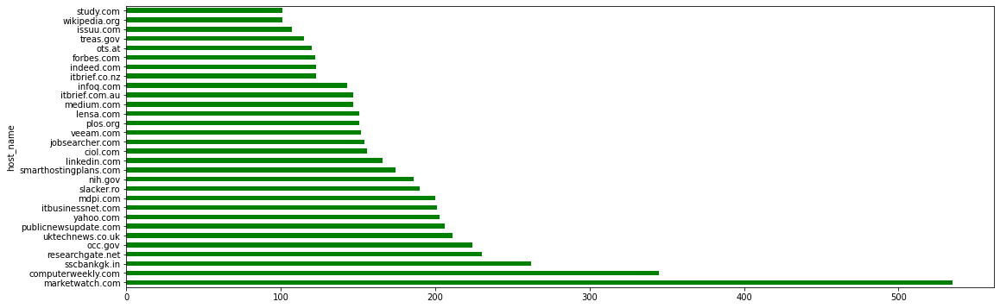

In [39]:
# Gráfico top30 fontes

grupo1.head(30).plot(kind = "barh", figsize = (18,6), color = "green", rot = 0)

In [40]:
# select rows containing 'thoughtworks.com'
df.loc[df['host_name'] == 'marketwatch.com'].head(3)

,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave,page_rank
52,2019-10-01,U.S. Soccer says women's national team can't f...,"Oct 1, 2019 — More On MarketWatch. How does th...",https://www.marketwatch.com/story/us-soccer-sa...,https,www.marketwatch.com,/story/us-soccer-says-womens-national-team-can...,NaN,NaN,marketwatch.com,13.249.93.71,geolocation,{},US,United States,Illinois,Chicago,-87.671249,41.84885,13.249.93.71,U.S. Soccer says women's national team can't f...,"Oct 1, 2019 — More On MarketWatch. How does th...",16509.0,set(),2019,10,4,1,1,Pre-COVID,12
25,2019-10-02,Opinion: Governments won't be able to stop Fac...,"Oct 3, 2019 — It ended up being a disaster. An...",https://www.marketwatch.com/story/governments-...,https,www.marketwatch.com,/story/governments-wont-be-able-to-stop-facebo...,NaN,NaN,marketwatch.com,13.249.93.129,geolocation,{},US,United States,Illinois,Chicago,-87.671249,41.84885,13.249.93.129,Opinion: Governments won't be able to stop Fac...,"Oct 3, 2019 — It ended up being a disaster. An...",16509.0,set(),2019,10,4,2,2,Pre-COVID,36
25,2019-10-04,Salesforce's Marc Benioff urges fellow CEOs to...,"Oct 4, 2019 — Salesforce's niche is making sof...",https://www.marketwatch.com/story/salesforces-...,https,www.marketwatch.com,/story/salesforces-marc-benioff-urges-fellow-c...,NaN,NaN,marketwatch.com,13.249.93.29,geolocation,{},US,United States,Illinois,Chicago,-87.671249,41.84885,13.249.93.29,Salesforce's Marc Benioff urges fellow CEOs to...,"Oct 4, 2019 — Salesforce's niche is making sof...",16509.0,set(),2019,10,4,4,4,Pre-COVID,4


## Tarefa 2: Qual é a distribuição de frequência por período total

In [41]:
sumary = df.groupby(['date']).agg(
    counts = pd.NamedAgg(column='date', aggfunc='count'),
        
).reset_index()

In [42]:
sumary.head()

,date,counts
0,2019-10-01,85
1,2019-10-02,39
2,2019-10-03,36
3,2019-10-04,22
4,2019-10-05,21


In [43]:
# convert the datetime column to a datetime type
sumary.date = pd.to_datetime(sumary.date)


In [44]:
# set the column as the index
sumary.set_index('date', inplace=True)

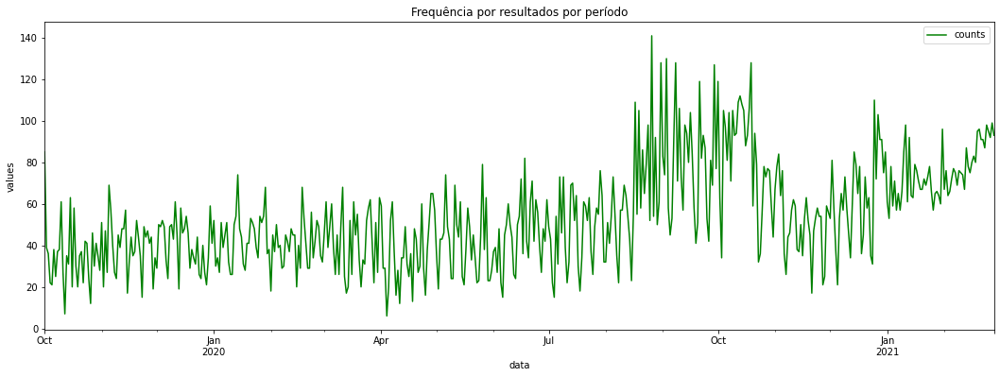

In [45]:
# graph
ax = sumary.plot(color = 'g', figsize = (18,6))
plt.xlabel("data")
plt.ylabel('values')
plt.title("Frequência por resultados por período")
plt.show()

In [46]:
sumary_host_name = df.groupby(['date','host_name']).agg(
    counts = pd.NamedAgg(column='host_name', aggfunc='count'),
        
).reset_index()

In [47]:
sumary_host_name

,date,host_name,counts
0,2019-10-01,2-spyware.com,1
1,2019-10-01,2wtech.com,1
2,2019-10-01,acs.org,2
3,2019-10-01,aibusiness.com,1
4,2019-10-01,ametsoc.org,1
...,...,...,...
26192,2021-02-28,walktheroom.com,1
26193,2021-02-28,wichita.edu,1
26194,2021-02-28,wikipedia.org,1
26195,2021-02-28,xxscss.com,1



## Tarefa 2.1: Qual é a distribuição de frequência por trimestre



In [48]:
quarter_sumary = df.groupby(['date']).agg(
    counts = pd.NamedAgg(column='date', aggfunc='count'),
        
).reset_index()

In [49]:
quarter_sumary = quarter_sumary.set_index('date')
quarter_sumary.index = quarter_sumary.index.to_period("Q")

In [50]:
quarter_sumary.head()

,counts
date,
2019Q4,85
2019Q4,39
2019Q4,36
2019Q4,22
2019Q4,21


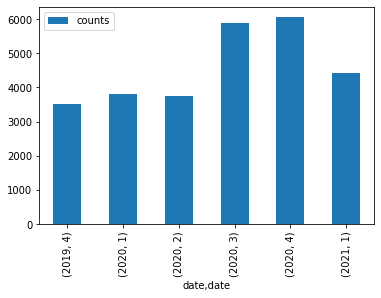

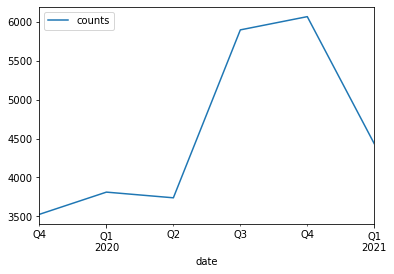

In [51]:
quarter_sumary.groupby(by=[quarter_sumary.index.year, quarter_sumary.index.quarter]).sum().plot(kind='bar')
quarter_sumary.groupby(by=[quarter_sumary.index.year, quarter_sumary.index.quarter]).transform('sum').plot()

# PNL - basic insights




In [52]:
print(df.shape); df.head()

(27472, 31)


,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave,page_rank
41,2019-10-01,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",https://pubs.acs.org/doi/abs/10.1021/acs.est.9...,https,pubs.acs.org,/doi/abs/10.1021/acs.est.9b04261,NaN,NaN,acs.org,104.18.0.20,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,104.18.0.20,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",13335.0,set(),2019,10,4,1,1,Pre-COVID,1
22,2019-10-01,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,https://intervision.com/cloud-solutions/cloud-...,https,intervision.com,/cloud-solutions/cloud-security/,NaN,NaN,intervision.com,199.255.228.242,geolocation,{},US,United States,Missouri,Wildwood,-90.533241,38.672291,199.255.228.242,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,27240.0,set(),2019,10,4,1,1,Pre-COVID,2
23,2019-10-01,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",https://www.theamegroup.com/the-ame-group-acqu...,https,www.theamegroup.com,/the-ame-group-acquires-integrity-it/,NaN,NaN,theamegroup.com,45.79.188.162,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,45.79.188.162,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",63949.0,set(),2019,10,4,1,1,Pre-COVID,3
24,2019-10-01,New York's Engineering Pay Is Hitting Silicon ...,"Oct 2, 2019 — Hiring software engineers has be...",https://www.ere.net/new-yorks-engineering-pay-...,https,www.ere.net,/new-yorks-engineering-pay-is-hitting-silicon-...,NaN,NaN,ere.net,35.202.23.254,geolocation,{},US,United States,Iowa,Council Bluffs,-95.877357,41.232960,35.202.23.254,New York's Engineering Pay Is Hitting Silicon ...,"Oct 2, 2019 — Hiring software engineers has be...",15169.0,set(),2019,10,4,1,1,Pre-COVID,4
25,2019-10-01,Manchester Data Centre Announced as PoP (Point...,"It offers members choice of not only location,...",https://www.manchesterdigital.com/post/teledat...,https,www.manchesterdigital.com,/post/teledata-uk-ltd/manchester-data-centre-a...,NaN,NaN,manchesterdigital.com,104.26.8.224,geolocation,{},SG,Singapore,South West,Singapore,103.819801,1.320000,104.26.8.224,Manchester Data Centre Announced as PoP (Point...,"It offers members choice of not only location,...",13335.0,set(),2019,10,4,1,1,Pre-COVID,5


### Texthero
https://analyticsindiamag.com/texthero-guide-a-python-toolkit-for-text-processing/

####SpaCy
- https://www.analyticsvidhya.com/blog/2020/06/nlp-project-information-extraction/

####clusterização
- https://www.analyticsvidhya.com/blog/2020/08/how-to-use-texthero-to-prepare-a-text-based-dataset-for-your-nlp-project/


####automl
- https://gluon-nlp.mxnet.io/

## Basic Pre-processing

### 1. Preprocessing the Text


#### 1.1 Cleaning the text

It runs the following seven functions by default when using clean()

1. fillna(s) Replace not assigned values with empty spaces.
2. lowercase(s) Lowercase all text.
3. remove_digits() Remove all blocks of digits.
4. remove_punctuation() Remove all string.punctuation (!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~).
5. remove_diacritics() Remove all accents from strings.
6. remove_stopwords() Remove all stop words.
7. remove_whitespace() Remove all white space between words.

In [53]:
# Merge columns (header and summary)
df["header"] = df["header"].apply(str)
df['summary'] = df['summary'].apply(str)
df['link'] = df['link'].apply(str)

### Clear 'link' column

In [54]:
#create a custom cleaning pipeline
#from texthero import preprocessing

custom_pipeline = [preprocessing.fillna
                   , preprocessing.lowercase
                   , preprocessing.remove_digits
                   , preprocessing.remove_punctuation
                   , preprocessing.remove_diacritics
                   , preprocessing.remove_stopwords
                   , preprocessing.remove_whitespace
                   , preprocessing.stem]
#pass the custom_pipeline to the pipeline argument
df['link2'] = hero.clean(df['link'], pipeline = custom_pipeline)

In [55]:
df['link2'].head()

41               https pub ac org doi ab ac est 9b04261
22           https intervis com cloud solut cloud secur
23    https www theamegroup com ame group acquir integr
24    https www ere net new york engin pay hit silic...
25    https www manchesterdigit com post teledata uk...
Name: link2, dtype: object

In [56]:
# Merge header and summary columns

#df["text"] =  df["header"] + " " + df["summary"]
df["text_context_true"] =  df["header_context_true"] + " " + df["summary_context_true"] + df["link2"]
df['text_context_true'] = df['text_context_true'].apply(lambda x: str(x))

In [57]:
# clean basic

#df['clean_content'] = hero.clean(df['text_context_true']) 

In [58]:
#create a custom cleaning pipeline
#from texthero import preprocessing

custom_pipeline = [preprocessing.fillna
                   , preprocessing.lowercase
                   , preprocessing.remove_digits
                   , preprocessing.remove_punctuation
                   , preprocessing.remove_diacritics
                   , preprocessing.remove_stopwords
                   , preprocessing.remove_whitespace
                   , preprocessing.stem]
#pass the custom_pipeline to the pipeline argument
df['clean_content'] = hero.clean(df['text_context_true'], pipeline = custom_pipeline)

In [59]:
df['clean_content'].head()

41    indoor illumin terpen bleach emiss lead oct --...
22    cloud secur solut servic intervis extens softw...
23    ame group acquir integr ame group oct -- secur...
24    new york engin pay hit silicon valley level oc...
25    manchest data centr announc pop point offer me...
Name: clean_content, dtype: object

In [60]:
import texthero as hero
from texthero import stopwords
import pandas as pd
default_stopwords = stopwords.DEFAULT
custom_stopwords = default_stopwords.union(set(["*","http", "https", "www", "com", "text", "_", "-", "io", "pdf", "file", "id",
                                                "jan", "feb", "mar", "apr", "mai", "jun", "jul", "ago", "set", "out", "nov", 'dez',
                                                "vs", "page", "html", "type", "digit", "de", "co", "wp", 'item']))
#s = pd.Series("Texthero is not only for the heroes www")

df['clean_content'] = hero.remove_stopwords(df['clean_content'], custom_stopwords)

#### 1.2. Tokenize the text

In [61]:
hero.tokenize(df['clean_content'])

41    [indoor, illumin, terpen, bleach, emiss, lead,...
22    [cloud, secur, solut, servic, intervis, extens...
23    [ame, group, acquir, integr, ame, group, oct, ...
24    [new, york, engin, pay, hit, silicon, valley, ...
25    [manchest, data, centr, announc, pop, point, o...
                            ...                        
28    [emoticon, keyboard, iphon, 101tw, replac, scr...
27    [gcu, learner, dissert, day, person, statement...
26    [sam4, alpha, lite, cafe, bar, restaur, pos, s...
35    [current, direct, biopsycholog, cep, unep, org...
99    [solut, pub, gcu, inclus, dynam, natur, strong...
Name: clean_content, Length: 27472, dtype: object

#### 3. Stemming

In [62]:
hero.stem(df['clean_content'], stem='snowball')

41    indoor illumin terpen bleach emiss lead oct co...
22    cloud secur solut servic intervi exten softwar...
23    ame group acquir integr ame group oct secur se...
24    new york engin pay hit silicon valley level oc...
25    manchest data centr announc pop point offer me...
                            ...                        
28    emoticon keyboard iphon 101tw replac screen ta...
27    gcu learner dissert day person statement cambr...
26    sam4 alpha lite cafe bar restaur pos system da...
35    current direct biopsycholog cep unep org day p...
99    solut pub gcu inclus dynam natur strong academ...
Name: clean_content, Length: 27472, dtype: object

### 2. Visualize the Cleaned Text

#### 2.1 Wordcloud

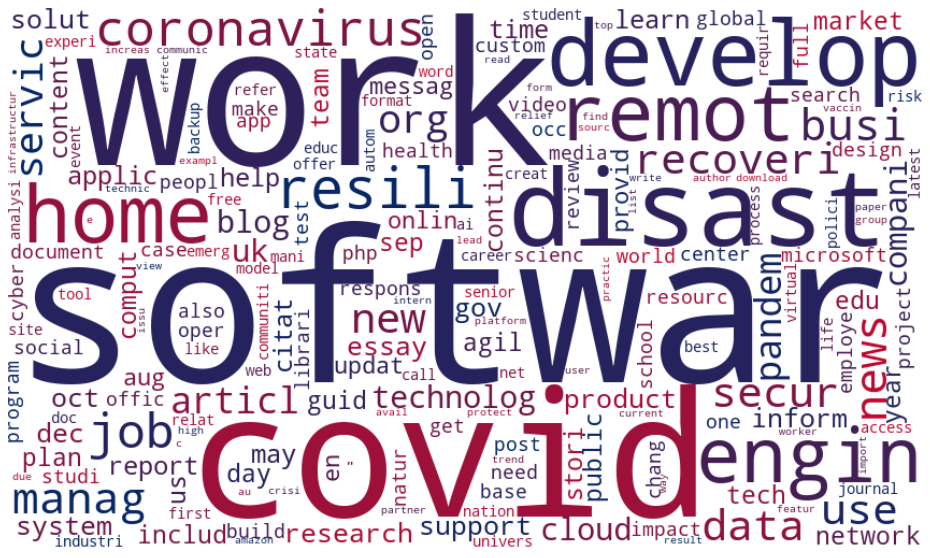

In [63]:
from matplotlib.colors import LinearSegmentedColormap
colors = ["#002868","#BF0A30"]
cmap = LinearSegmentedColormap.from_list("mycmap", colors)

hero.visualization.wordcloud(df['clean_content'], width=853, height=506, max_words=200, colormap=cmap, background_color='WHITE')

2.1 Top key words

In [64]:
hero.visualization.top_words(df['clean_content'])

softwar              16472
work                 14653
covid                11944
disast               10181
develop               9388
                     ...  
raizesguilhermina        1
bodhar                   1
todetail                 1
netizen                  1
job91486455              1
Name: clean_content, Length: 53696, dtype: int64

In [65]:
tw = hero.visualization.top_words(df['clean_content']).head(10)
#import plotly.express as px
#fig = px.bar(tw)
#fig.show()

In [66]:
tw.head(10)

softwar        16472
work           14653
covid          11944
disast         10181
develop         9388
home            7254
remot           6962
engin           6290
resili          5137
coronavirus     4964
Name: clean_content, dtype: int64

In [67]:
df_page_rank_10 = df[df['page_rank']<11]

print(df_page_rank_10.shape);
df_page_rank_10.head()

(5163, 34)


,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave,page_rank,link2,text_context_true,clean_content
41,2019-10-01,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",https://pubs.acs.org/doi/abs/10.1021/acs.est.9...,https,pubs.acs.org,/doi/abs/10.1021/acs.est.9b04261,NaN,NaN,acs.org,104.18.0.20,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,104.18.0.20,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",13335.0,set(),2019,10,4,1,1,Pre-COVID,1,https pub ac org doi ab ac est 9b04261,Indoor Illumination of Terpenes and Bleach Emi...,indoor illumin terpen bleach emiss lead oct c...
22,2019-10-01,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,https://intervision.com/cloud-solutions/cloud-...,https,intervision.com,/cloud-solutions/cloud-security/,NaN,NaN,intervision.com,199.255.228.242,geolocation,{},US,United States,Missouri,Wildwood,-90.533241,38.672291,199.255.228.242,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,27240.0,set(),2019,10,4,1,1,Pre-COVID,2,https intervis com cloud solut cloud secur,Cloud Security Solutions & Services | InterVis...,cloud secur solut servic intervis extens softw...
23,2019-10-01,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",https://www.theamegroup.com/the-ame-group-acqu...,https,www.theamegroup.com,/the-ame-group-acquires-integrity-it/,NaN,NaN,theamegroup.com,45.79.188.162,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,45.79.188.162,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",63949.0,set(),2019,10,4,1,1,Pre-COVID,3,https www theamegroup com ame group acquir integr,The AME Group Acquires Integrity IT - The AME ...,ame group acquir integr ame group oct secur s...
24,2019-10-01,New York's Engineering Pay Is Hitting Silicon ...,"Oct 2, 2019 — Hiring software engineers has be...",https://www.ere.net/new-yorks-engineering-pay-...,https,www.ere.net,/new-yorks-engineering-pay-is-hitting-silicon-...,NaN,NaN,ere.net,35.202.23.254,geolocation,{},US,United States,Iowa,Council Bluffs,-95.877357,41.232960,35.202.23.254,New York's Engineering Pay Is Hitting Silicon ...,"Oct 2, 2019 — Hiring software engineers has be...",15169.0,set(),2019,10,4,1,1,Pre-COVID,4,https www ere net new york engin pay hit silic...,New York's Engineering Pay Is Hitting Silicon ...,new york engin pay hit silicon valley level oc...
25,2019-10-01,Manchester Data Centre Announced as PoP (Point...,"It offers members choice of not only location,...",https://www.manchesterdigital.com/post/teledat...,https,www.manchesterdigital.com,/post/teledata-uk-ltd/manchester-data-centre-a...,NaN,NaN,manchesterdigital.com,104.26.8.224,geolocation,{},SG,Singapore,South West,Singapore,103.819801,1.320000,104.26.8.224,Manchester Data Centre Announced as PoP (Point...,"It offers members choice of not only location,...",13335.0,set(),2019,10,4,1,1,Pre-COVID,5,https www manchesterdigit com post teledata uk...,Manchester Data Centre Announced as PoP (Point...,manchest data centr announc pop point offer me...


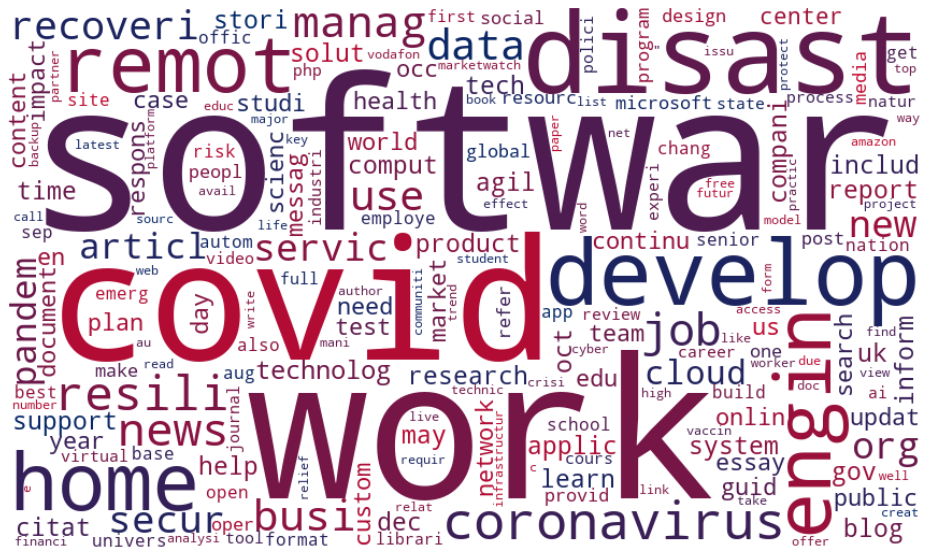

In [68]:
from matplotlib.colors import LinearSegmentedColormap
colors = ["#002868","#BF0A30"]
cmap = LinearSegmentedColormap.from_list("mycmap", colors)

hero.visualization.wordcloud(df_page_rank_10['clean_content'], width=853, height=506, max_words=200, colormap=cmap, background_color='WHITE')

2.1 Top key words

In [69]:
hero.visualization.top_words(df_page_rank_10['clean_content'])

softwar             3111
work                2718
covid               2350
disast              1858
develop             1711
                    ... 
swashbuckl             1
journalofaccount       1
sharon                 1
outsourcingport        1
20work                 1
Name: clean_content, Length: 17771, dtype: int64

In [70]:
tw_df_page_rank_10 = hero.visualization.top_words(df_page_rank_10['clean_content']).head(10)
#import plotly.express as px
#fig = px.bar(tw)
#fig.show()

In [71]:
# top keywords in dataframe: page rank <=10 

tw_df_page_rank_10.head(10)

softwar        3111
work           2718
covid          2350
disast         1858
develop        1711
home           1318
remot          1287
engin          1252
coronavirus    1074
resili          905
Name: clean_content, dtype: int64

In [72]:
# top keywords in all dataframe
tw.head(10)

softwar        16472
work           14653
covid          11944
disast         10181
develop         9388
home            7254
remot           6962
engin           6290
resili          5137
coronavirus     4964
Name: clean_content, dtype: int64

### 3. NLP Operations on Text

#### 3.1 Named Entities

In [73]:
#df['named_entities'] = hero.named_entities(df['clean_content'], package='spacy')
#df['named_entities'].head(3)

#### 3.2 Noun Chunks

In [74]:
#df['noun_chunks'] = hero.noun_chunks(df['clean_content'][:10])
#df['noun_chunks'].head(3)

# PNL - topic modeling

In [75]:
# Seguir com df completo ou apenas page rank <=10?

print(df_page_rank_10.shape); df_page_rank_10.head()


(5163, 34)


,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave,page_rank,link2,text_context_true,clean_content
41,2019-10-01,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",https://pubs.acs.org/doi/abs/10.1021/acs.est.9...,https,pubs.acs.org,/doi/abs/10.1021/acs.est.9b04261,NaN,NaN,acs.org,104.18.0.20,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,104.18.0.20,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",13335.0,set(),2019,10,4,1,1,Pre-COVID,1,https pub ac org doi ab ac est 9b04261,Indoor Illumination of Terpenes and Bleach Emi...,indoor illumin terpen bleach emiss lead oct c...
22,2019-10-01,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,https://intervision.com/cloud-solutions/cloud-...,https,intervision.com,/cloud-solutions/cloud-security/,NaN,NaN,intervision.com,199.255.228.242,geolocation,{},US,United States,Missouri,Wildwood,-90.533241,38.672291,199.255.228.242,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,27240.0,set(),2019,10,4,1,1,Pre-COVID,2,https intervis com cloud solut cloud secur,Cloud Security Solutions & Services | InterVis...,cloud secur solut servic intervis extens softw...
23,2019-10-01,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",https://www.theamegroup.com/the-ame-group-acqu...,https,www.theamegroup.com,/the-ame-group-acquires-integrity-it/,NaN,NaN,theamegroup.com,45.79.188.162,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,45.79.188.162,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",63949.0,set(),2019,10,4,1,1,Pre-COVID,3,https www theamegroup com ame group acquir integr,The AME Group Acquires Integrity IT - The AME ...,ame group acquir integr ame group oct secur s...
24,2019-10-01,New York's Engineering Pay Is Hitting Silicon ...,"Oct 2, 2019 — Hiring software engineers has be...",https://www.ere.net/new-yorks-engineering-pay-...,https,www.ere.net,/new-yorks-engineering-pay-is-hitting-silicon-...,NaN,NaN,ere.net,35.202.23.254,geolocation,{},US,United States,Iowa,Council Bluffs,-95.877357,41.232960,35.202.23.254,New York's Engineering Pay Is Hitting Silicon ...,"Oct 2, 2019 — Hiring software engineers has be...",15169.0,set(),2019,10,4,1,1,Pre-COVID,4,https www ere net new york engin pay hit silic...,New York's Engineering Pay Is Hitting Silicon ...,new york engin pay hit silicon valley level oc...
25,2019-10-01,Manchester Data Centre Announced as PoP (Point...,"It offers members choice of not only location,...",https://www.manchesterdigital.com/post/teledat...,https,www.manchesterdigital.com,/post/teledata-uk-ltd/manchester-data-centre-a...,NaN,NaN,manchesterdigital.com,104.26.8.224,geolocation,{},SG,Singapore,South West,Singapore,103.819801,1.320000,104.26.8.224,Manchester Data Centre Announced as PoP (Point...,"It offers members choice of not only location,...",13335.0,set(),2019,10,4,1,1,Pre-COVID,5,https www manchesterdigit com post teledata uk...,Manchester Data Centre Announced as PoP (Point...,manchest data centr announc pop point offer me...


### Subset by covid wave

In [76]:
df_page_rank_10['shock_wave'].value_counts()

COVID-shock    3326
Post-shock      920
Pre-COVID       917
Name: shock_wave, dtype: int64

In [77]:
df_precovid = df_page_rank_10[(df_page_rank_10['shock_wave'] == 'Pre-COVID')]
print(df_precovid.shape);
df_precovid.head(3)

(917, 34)


,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave,page_rank,link2,text_context_true,clean_content
41,2019-10-01,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",https://pubs.acs.org/doi/abs/10.1021/acs.est.9...,https,pubs.acs.org,/doi/abs/10.1021/acs.est.9b04261,NaN,NaN,acs.org,104.18.0.20,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,104.18.0.20,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",13335.0,set(),2019,10,4,1,1,Pre-COVID,1,https pub ac org doi ab ac est 9b04261,Indoor Illumination of Terpenes and Bleach Emi...,indoor illumin terpen bleach emiss lead oct c...
22,2019-10-01,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,https://intervision.com/cloud-solutions/cloud-...,https,intervision.com,/cloud-solutions/cloud-security/,NaN,NaN,intervision.com,199.255.228.242,geolocation,{},US,United States,Missouri,Wildwood,-90.533241,38.672291,199.255.228.242,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,27240.0,set(),2019,10,4,1,1,Pre-COVID,2,https intervis com cloud solut cloud secur,Cloud Security Solutions & Services | InterVis...,cloud secur solut servic intervis extens softw...
23,2019-10-01,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",https://www.theamegroup.com/the-ame-group-acqu...,https,www.theamegroup.com,/the-ame-group-acquires-integrity-it/,NaN,NaN,theamegroup.com,45.79.188.162,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,45.79.188.162,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",63949.0,set(),2019,10,4,1,1,Pre-COVID,3,https www theamegroup com ame group acquir integr,The AME Group Acquires Integrity IT - The AME ...,ame group acquir integr ame group oct secur s...


In [78]:
# sampling the data to select only 1000
#df_precovid = df_precovid.head(1000)

In [79]:
#Add pca value to dataframe to use as visualization coordinates
df_precovid['pca'] = (
            df_precovid['clean_content']
            .pipe(hero.tfidf)
            .pipe(hero.pca)
   )
#Add k-means cluster to dataframe 
df_precovid['kmeans'] = (
            df_precovid['clean_content']
            .pipe(hero.tfidf)
            .pipe(hero.kmeans)
   )

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_kmeans.py:934: FutureWarning:

'precompute_distances' was deprecated in version 0.23 and will be removed in 0.25. It has no effect

/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_kmeans.py:939: FutureWarning:

'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/use

In [80]:
df_precovid.head(3)

,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave,page_rank,link2,text_context_true,clean_content,pca,kmeans
41,2019-10-01,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",https://pubs.acs.org/doi/abs/10.1021/acs.est.9...,https,pubs.acs.org,/doi/abs/10.1021/acs.est.9b04261,NaN,NaN,acs.org,104.18.0.20,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,104.18.0.20,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",13335.0,set(),2019,10,4,1,1,Pre-COVID,1,https pub ac org doi ab ac est 9b04261,Indoor Illumination of Terpenes and Bleach Emi...,indoor illumin terpen bleach emiss lead oct c...,"[0.008730992270500466, -0.056171571567155944]",3
22,2019-10-01,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,https://intervision.com/cloud-solutions/cloud-...,https,intervision.com,/cloud-solutions/cloud-security/,NaN,NaN,intervision.com,199.255.228.242,geolocation,{},US,United States,Missouri,Wildwood,-90.533241,38.672291,199.255.228.242,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,27240.0,set(),2019,10,4,1,1,Pre-COVID,2,https intervis com cloud solut cloud secur,Cloud Security Solutions & Services | InterVis...,cloud secur solut servic intervis extens softw...,"[-0.08571600139172561, 0.05575622436102703]",1
23,2019-10-01,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",https://www.theamegroup.com/the-ame-group-acqu...,https,www.theamegroup.com,/the-ame-group-acquires-integrity-it/,NaN,NaN,theamegroup.com,45.79.188.162,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,45.79.188.162,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",63949.0,set(),2019,10,4,1,1,Pre-COVID,3,https www theamegroup com ame group acquir integr,The AME Group Acquires Integrity IT - The AME ...,ame group acquir integr ame group oct secur s...,"[-0.03549416338243059, -0.018120306056147856]",3


In [81]:
#generate scatter plot
hero.scatterplot(df_precovid, 'pca', color = 'kmeans', hover_data=['clean_content'] )

### 4. Topic modeling with scikit learn

Topic Modeling Quora Questions with LDA & NMF - by: Susan Li

https://towardsdatascience.com/topic-modeling-quora-questions-with-lda-nmf-aff8dce5e1dd

- git da autora

https://github.com/susanli2016/NLP-with-Python
https://github.com/susanli2016/NLP-with-Python/blob/master/Quora%20Topic%20Modeling_scikit%20learn_LDA.ipynb
https://github.com/susanli2016/NLP-with-Python/blob/master/Quora%20Topic%20Modeling_scikit%20learn_NMF.ipynb

In [82]:
print(df.shape); df.head()

(27472, 34)


,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave,page_rank,link2,text_context_true,clean_content
41,2019-10-01,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",https://pubs.acs.org/doi/abs/10.1021/acs.est.9...,https,pubs.acs.org,/doi/abs/10.1021/acs.est.9b04261,NaN,NaN,acs.org,104.18.0.20,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,104.18.0.20,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",13335.0,set(),2019,10,4,1,1,Pre-COVID,1,https pub ac org doi ab ac est 9b04261,Indoor Illumination of Terpenes and Bleach Emi...,indoor illumin terpen bleach emiss lead oct c...
22,2019-10-01,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,https://intervision.com/cloud-solutions/cloud-...,https,intervision.com,/cloud-solutions/cloud-security/,NaN,NaN,intervision.com,199.255.228.242,geolocation,{},US,United States,Missouri,Wildwood,-90.533241,38.672291,199.255.228.242,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,27240.0,set(),2019,10,4,1,1,Pre-COVID,2,https intervis com cloud solut cloud secur,Cloud Security Solutions & Services | InterVis...,cloud secur solut servic intervis extens softw...
23,2019-10-01,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",https://www.theamegroup.com/the-ame-group-acqu...,https,www.theamegroup.com,/the-ame-group-acquires-integrity-it/,NaN,NaN,theamegroup.com,45.79.188.162,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,45.79.188.162,The AME Group Acquires Integrity IT - The AME ...,"Oct 1, 2019 — ... security services, project m...",63949.0,set(),2019,10,4,1,1,Pre-COVID,3,https www theamegroup com ame group acquir integr,The AME Group Acquires Integrity IT - The AME ...,ame group acquir integr ame group oct secur s...
24,2019-10-01,New York's Engineering Pay Is Hitting Silicon ...,"Oct 2, 2019 — Hiring software engineers has be...",https://www.ere.net/new-yorks-engineering-pay-...,https,www.ere.net,/new-yorks-engineering-pay-is-hitting-silicon-...,NaN,NaN,ere.net,35.202.23.254,geolocation,{},US,United States,Iowa,Council Bluffs,-95.877357,41.232960,35.202.23.254,New York's Engineering Pay Is Hitting Silicon ...,"Oct 2, 2019 — Hiring software engineers has be...",15169.0,set(),2019,10,4,1,1,Pre-COVID,4,https www ere net new york engin pay hit silic...,New York's Engineering Pay Is Hitting Silicon ...,new york engin pay hit silicon valley level oc...
25,2019-10-01,Manchester Data Centre Announced as PoP (Point...,"It offers members choice of not only location,...",https://www.manchesterdigital.com/post/teledat...,https,www.manchesterdigital.com,/post/teledata-uk-ltd/manchester-data-centre-a...,NaN,NaN,manchesterdigital.com,104.26.8.224,geolocation,{},SG,Singapore,South West,Singapore,103.819801,1.320000,104.26.8.224,Manchester Data Centre Announced as PoP (Point...,"It offers members choice of not only location,...",13335.0,set(),2019,10,4,1,1,Pre-COVID,5,https www manchesterdigit com post teledata uk...,Manchester Data Centre Announced as PoP (Point...,manchest data centr announc pop point offer me...


In [83]:

import re, nltk, spacy, gensim, string

from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from pprint import pprint

import pyLDAvis
import pyLDAvis.sklearn
import matplotlib.pyplot as plt
%matplotlib inline

from plotly.offline import plot
import plotly.graph_objects as go
import plotly.express as px

/usr/local/lib/python3.7/dist-packages/past/types/oldstr.py:5: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working



In [84]:
# get unigramns
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_words(df['clean_content'], 30)
df2 = pd.DataFrame(common_words, columns = ['unigram' , 'count'])
df2.head()

,unigram,count
0,softwar,16472
1,work,14655
2,covid,11945
3,disast,10181
4,develop,9388


In [85]:

fig = go.Figure([go.Bar(x=df2['unigram'], y=df2['count'])])
fig.update_layout(title=go.layout.Title(text="Top 30 unigrams in the question text after removing stop words and lemmatization"))
fig.show()


In [86]:
# get  bigrams
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_bigram(df['clean_content'], 20)
df3 = pd.DataFrame(common_words, columns = ['bigram' , 'count'])
df3.head()

,bigram,count
0,softwar develop,7367
1,work home,6362
2,remot work,4758
3,disast recoveri,3115
4,softwar engin,1817


In [87]:
fig = go.Figure([go.Bar(x=df3['bigram'], y=df3['count'])])
fig.update_layout(title=go.layout.Title(text="Top 20 bigrams in the question text after removing stop words and lemmatization"))
fig.show()

In [88]:
#get trigrams
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_trigram(df['clean_content'], 20)
df4 = pd.DataFrame(common_words, columns = ['trigram' , 'count'])
df4.head()

,trigram,count
0,agil softwar develop,651
1,remot work remot,502
2,work home work,462
3,softwar softwar develop,428
4,remot work remov,384


In [89]:
fig = go.Figure([go.Bar(x=df4['trigram'], y=df4['count'])])
fig.update_layout(title=go.layout.Title(text="Top 20 trigrams in the question text"))
fig.show()

In [90]:
vectorizer = CountVectorizer(analyzer='word',       
                             min_df=3,                        # minimum required occurences of a word 
                             stop_words='english',             # remove stop words
                             lowercase=True,                   # convert all words to lowercase
                             token_pattern='[a-zA-Z0-9]{3,}',  # num chars > 3
                             max_features=5000,             # max number of unique words. Build a vocabulary that only consider the top max_features ordered by term frequency across the corpus
                            )

data_vectorized = vectorizer.fit_transform(df['clean_content'])

lda_model = LatentDirichletAllocation(n_components=20, # Number of topics
                                      learning_method='online',
                                      random_state=0,       
                                      n_jobs = -1  # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_vectorized)

In [91]:
pyLDAvis.enable_notebook()
pyLDAvis.sklearn.prepare(lda_model, data_vectorized, vectorizer, mds='tsne')

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
11     -10.878068   10.538728       1        1  13.440134
1      -60.884026  -75.591820       2        1   7.256037
6       -2.336119  -53.289074       3        1   6.614102
10     -61.385319  -12.914634       4        1   6.476606
0      -28.737743  126.296997       5        1   6.358264
18       1.066606 -123.552811       6        1   6.144322
13      45.140720   -7.947869       7        1   5.189320
7     -140.795975  -98.530548       8        1   5.138799
3       61.531681  -83.240562       9        1   5.054715
4      -72.563057 -140.396881      10        1   4.339410
8       15.984491   63.578186      11        1   4.311824
16    -160.851624   68.945145      12        1   4.284066
12      85.961830   51.922935      13        1   3.700554
9      -99.020836  109.936348      14        1   3.685034
15    -176.764130   -8.681684      15        1   3.482568
5     -117.189880  -37.420200      16        1   3.152019
14     108.829918  -22.946203      17        1   3.096093
2       47.588097  121.934814      18        1   3.018525
19    -106.467834   30.176889      19        1   2.755390
17     -50.613804   59.328842      20        1   2.502219, topic_info=         Term          Freq         Total Category  logprob  loglift
4927     work  14155.000000  14155.000000  Default  30.0000  30.0000
2095     home   7172.000000   7172.000000  Default  29.0000  29.0000
3693    remot   6693.000000   6693.000000  Default  28.0000  28.0000
1279  develop   9172.000000   9172.000000  Default  27.0000  27.0000
1065    covid  12207.000000  12207.000000  Default  26.0000  26.0000
...       ...           ...           ...      ...      ...      ...
3747  respons    281.334917   1232.350835  Topic20  -4.1019   2.2109
3100   option    166.178276    376.831390  Topic20  -4.6283   2.8693
3964   servic    209.609336   2902.221353  Topic20  -4.3962   1.0600
4395  technic    158.090919    640.954849  Topic20  -4.6782   2.2882
1167     data    161.569091   3373.664377  Topic20  -4.6565   0.6492

[986 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
32       10  0.997316   aastha
34        3  0.991044  abbrevi
37       19  0.996333      abl
45        9  0.997135   academ
52        3  0.815336   access
...     ...       ...      ...
4969     10  0.395842     year
4973     10  0.998519     york
4978     15  0.996312      yrs
4992     20  0.993769     zone
4993     19  0.996389     zoom

[1347 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[12, 2, 7, 11, 1, 19, 14, 8, 4, 5, 9, 17, 13, 10, 16, 6, 15, 3, 20, 18])

In [92]:
# Show top 20 keywords for each topic
def show_topics(vectorizer=vectorizer, lda_model=lda_model, n_words=20):
    keywords = np.array(vectorizer.get_feature_names())
    topic_keywords = []
    for topic_weights in lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords

topic_keywords = show_topics(vectorizer=vectorizer, lda_model=lda_model, n_words=20)        

# Topic - Keywords Dataframe
df_topic_keywords = pd.DataFrame(topic_keywords)
df_topic_keywords.columns = ['Word '+str(i) for i in range(df_topic_keywords.shape[1])]
df_topic_keywords.index = ['Topic '+str(i) for i in range(df_topic_keywords.shape[0])]
df_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14,Word 15,Word 16,Word 17,Word 18,Word 19
Topic 0,news,covid,coronavirus,gov,health,occ,disast,market,new,search,financi,number,launch,center,technolog,major,transform,aug,meet,sep
Topic 1,engin,softwar,job,develop,data,open,learn,senior,test,experi,process,tool,make,googl,model,perform,use,machin,aug,look
Topic 2,articl,journal,org,covid,lead,link,email,gov,fund,cio,stock,valu,nih,doi,ncbi,host,feder,pmc,chat,maintain
Topic 3,design,covid,school,plan,softwar,support,student,creat,busi,onlin,download,help,govern,servic,use,web,start,includ,unit,prepar
Topic 4,new,social,cyber,network,autom,remot,softwar,futur,media,trend,year,cybersecur,agil,becom,idea,dec,import,expand,attack,york
Topic 5,review,natur,disast,question,book,insight,languag,comment,econom,sale,alert,editor,person,regist,answer,physic,disrupt,award,glassdoor,china
Topic 6,covid,citat,edu,librari,engin,guid,scienc,research,format,free,write,coronavirus,refer,univers,educ,learn,access,author,apa,crisi
Topic 7,use,covid,messag,inform,softwar,exampl,includ,data,word,program,center,form,train,read,time,assist,base,index,org,speech
Topic 8,pandem,world,blog,tech,practic,best,covid,analyt,communic,dec,organ,featur,articl,key,global,approach,use,softwar,custom,function
Topic 9,disast,recoveri,net,avail,doc,high,english,administr,enterpris,support,product,dec,htm,server,guid,come,forc,cloud,document,help


In [93]:

Topics_theme = ['Topic1', 'Topic2', 'Topic3', 'Topic4', 'Topic5',  
                'Topic6', 'Topic7', 'Topic8', 'Topic9', 'Topic10',
                'Topic11', 'Topic12', 'Topic13', 'Topic14', 'Topic15',
                'Topic16', 'Topic17', 'Topic18', 'Topic19', 'Topic20']
df_topic_keywords['topic_theme'] = Topics_theme
df_topic_keywords

,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,Word 9,Word 10,Word 11,Word 12,Word 13,Word 14,Word 15,Word 16,Word 17,Word 18,Word 19,topic_theme
Topic 0,news,covid,coronavirus,gov,health,occ,disast,market,new,search,financi,number,launch,center,technolog,major,transform,aug,meet,sep,Topic1
Topic 1,engin,softwar,job,develop,data,open,learn,senior,test,experi,process,tool,make,googl,model,perform,use,machin,aug,look,Topic2
Topic 2,articl,journal,org,covid,lead,link,email,gov,fund,cio,stock,valu,nih,doi,ncbi,host,feder,pmc,chat,maintain,Topic3
Topic 3,design,covid,school,plan,softwar,support,student,creat,busi,onlin,download,help,govern,servic,use,web,start,includ,unit,prepar,Topic4
Topic 4,new,social,cyber,network,autom,remot,softwar,futur,media,trend,year,cybersecur,agil,becom,idea,dec,import,expand,attack,york,Topic5
Topic 5,review,natur,disast,question,book,insight,languag,comment,econom,sale,alert,editor,person,regist,answer,physic,disrupt,award,glassdoor,china,Topic6
Topic 6,covid,citat,edu,librari,engin,guid,scienc,research,format,free,write,coronavirus,refer,univers,educ,learn,access,author,apa,crisi,Topic7
Topic 7,use,covid,messag,inform,softwar,exampl,includ,data,word,program,center,form,train,read,time,assist,base,index,org,speech,Topic8
Topic 8,pandem,world,blog,tech,practic,best,covid,analyt,communic,dec,organ,featur,articl,key,global,approach,use,softwar,custom,function,Topic9
Topic 9,disast,recoveri,net,avail,doc,high,english,administr,enterpris,support,product,dec,htm,server,guid,come,forc,cloud,document,help,Topic10


In [94]:
df_topic_keywords.set_index('topic_theme', inplace=True)

In [95]:

df_topic_keywords.T

topic_theme,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,Topic10,Topic11,Topic12,Topic13,Topic14,Topic15,Topic16,Topic17,Topic18,Topic19,Topic20
Word 0,news,engin,articl,design,new,review,covid,use,pandem,disast,disast,work,video,coronavirus,case,softwar,essay,partner,secur,softwar
Word 1,covid,softwar,journal,covid,social,natur,citat,covid,world,recoveri,report,develop,news,covid,industri,disast,day,india,servic,latest
Word 2,coronavirus,job,org,school,cyber,disast,edu,messag,blog,net,resili,home,covid,stori,org,backup,studi,knowledg,solut,cours
Word 3,gov,develop,covid,plan,network,question,librari,inform,tech,avail,state,remot,event,vaccin,skill,bank,paper,financ,cloud,mobil
Word 4,health,data,lead,softwar,autom,book,engin,softwar,practic,doc,risk,softwar,polici,microsoft,week,strategi,way,cisco,applic,manag
Word 5,occ,open,link,support,remot,insight,guid,exampl,best,high,global,disast,infrastructur,emerg,power,end,code,date,data,director
Word 6,disast,learn,email,student,softwar,languag,scienc,includ,covid,english,content,resili,virtual,peopl,new,websit,softwar,base,technolog,store
Word 7,market,senior,gov,creat,futur,comment,research,data,analyt,administr,intern,busi,mean,live,articl,app,analysi,logo,sep,disast
Word 8,new,test,fund,busi,media,econom,format,word,communic,enterpris,manag,recoveri,view,salari,content,step,php,document,comput,vodafon
Word 9,search,experi,cio,onlin,trend,sale,free,program,dec,support,pandem,compani,updat,news,address,busi,improv,real,resili,develop


In [96]:
# Create Document - Topic Matrix
lda_output = lda_model.transform(data_vectorized)

# column names
topicnames = df_topic_keywords.T.columns
# topicnames = ["Topic" + str(i) for i in range(20)]

# index names
docnames = ["Doc" + str(i) for i in range(len(df))]

# Make the pandas dataframe
df_document_topic = pd.DataFrame(np.round(lda_output, 2), columns=topicnames, index=docnames)

# Get dominant topic for each document
dominant_topic = np.argmax(df_document_topic.values, axis=1)
df_document_topic['dominant_topic'] = dominant_topic
df_document_topic

topic_theme,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,Topic10,Topic11,Topic12,Topic13,Topic14,Topic15,Topic16,Topic17,Topic18,Topic19,Topic20,dominant_topic
Doc0,0.00,0.00,0.64,0.00,0.14,0.00,0.17,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,2
Doc1,0.00,0.00,0.00,0.00,0.05,0.00,0.00,0.00,0.00,0.05,0.21,0.24,0.00,0.0,0.00,0.00,0.00,0.00,0.41,0.0,18
Doc2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.07,0.00,0.00,0.89,0.0,18
Doc3,0.00,0.16,0.00,0.00,0.64,0.00,0.00,0.00,0.00,0.03,0.00,0.07,0.00,0.0,0.00,0.00,0.07,0.00,0.00,0.0,4
Doc4,0.00,0.07,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.04,0.87,0.0,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Doc27467,0.00,0.00,0.00,0.12,0.00,0.00,0.00,0.08,0.00,0.15,0.00,0.00,0.11,0.0,0.00,0.23,0.11,0.10,0.05,0.0,15
Doc27468,0.00,0.00,0.00,0.00,0.00,0.00,0.16,0.17,0.13,0.04,0.05,0.05,0.00,0.0,0.16,0.13,0.09,0.00,0.00,0.0,7
Doc27469,0.14,0.00,0.00,0.08,0.08,0.00,0.04,0.30,0.09,0.00,0.00,0.03,0.00,0.0,0.00,0.00,0.08,0.00,0.15,0.0,7
Doc27470,0.00,0.00,0.00,0.15,0.00,0.06,0.00,0.28,0.00,0.00,0.17,0.13,0.00,0.0,0.00,0.06,0.06,0.00,0.06,0.0,7


In [97]:
df_document_topic.reset_index(inplace=True)
df_sent_topic= pd.merge(df, df_document_topic, left_index=True, right_index=True)
df_sent_topic.drop('index', axis=1, inplace=True)
df_sent_topic.head()

,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave,page_rank,link2,text_context_true,clean_content,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,Topic10,Topic11,Topic12,Topic13,Topic14,Topic15,Topic16,Topic17,Topic18,Topic19,Topic20,dominant_topic
0,2019-10-01,What You Need for Effective Remote Work - Simp...,"Oct 2, 2019 — You also need a decent workspace...",https://simpleprogrammer.com/effective-remote-...,https,simpleprogrammer.com,/effective-remote-work/,NaN,NaN,simpleprogrammer.com,3.234.104.255,geolocation,{},US,United States,Virginia,Ashburn,-77.474197,39.043701,3.234.104.255,What You Need for Effective Remote Work - Simp...,"Oct 2, 2019 — You also need a decent workspace...",14618.0,set(),2019,10,4,1,1,Pre-COVID,73,https simpleprogramm com effect remot work,What You Need for Effective Remote Work - Simp...,need effect remot work simpl programm oct als...,0.0,0.0,0.64,0.0,0.14,0.0,0.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
0,2019-10-01,Citing Your Sources - Sociology - Research Gui...,"Oct 1, 2019 — COVID-19 Update for APA Manual a...",https://guides.lib.umich.edu/c.php?g=282774&p=...,https,guides.lib.umich.edu,/c.php,g=282774&p=1884187,NaN,umich.edu,54.85.246.96,geolocation,{},US,United States,Virginia,Ashburn,-77.474197,39.043701,54.85.246.96,Citing Your Sources - Sociology - Research Gui...,"Oct 1, 2019 — COVID-19 Update for APA Manual a...",14618.0,set(),2019,10,4,1,1,Pre-COVID,85,https guid lib umich edu c php g p,Citing Your Sources - Sociology - Research Gui...,cite sourc sociolog research guid oct covid u...,0.0,0.0,0.64,0.0,0.14,0.0,0.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
0,2019-10-02,"Cloud Services : Storage, Hosting, Backup, Ema...",With the advent of flexible and remote working...,https://e2etechnologies.co.uk/service/cloud-ho...,https,e2etechnologies.co.uk,/service/cloud-hosting-storage-and-email/,NaN,NaN,e2etechnologies.co.uk,20.58.112.177,geolocation,{},GB,United Kingdom,Wales,Cardiff,-3.181390,51.494438,20.58.112.177,"Cloud Services : Storage, Hosting, Backup, Ema...",With the advent of flexible and remote working...,8075.0,set(),2019,10,4,2,2,Pre-COVID,8,https e2etechnolog co uk servic cloud host sto...,"Cloud Services : Storage, Hosting, Backup, Ema...",cloud servic storag host backup email wirral a...,0.0,0.0,0.64,0.0,0.14,0.0,0.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
0,2019-10-02,Give a Gift - Donate Today - Food for the Hungry,Children are the most vulnerable when violence...,https://www.fh.org/give/,https,www.fh.org,/give/,NaN,NaN,fh.org,35.230.79.172,geolocation,{},US,United States,Oregon,The Dalles,-121.186996,45.554249,35.230.79.172,Give a Gift - Donate Today - Food for the Hungry,Children are the most vulnerable when violence...,15169.0,set(),2019,10,4,2,2,Pre-COVID,22,https www fh org give,Give a Gift - Donate Today - Food for the Hung...,give gift donat today food hungri children vul...,0.0,0.0,0.64,0.0,0.14,0.0,0.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
0,2019-10-03,"Professional JavaScript for Web Developers, 4t...",... Internet & WWW · Office Productivity · Ope...,https://www.wiley.com/en-us/Professional+JavaS...,https,www.wiley.com,/en-us/Professional+JavaScript+for+Web+Develop...,NaN,NaN,wiley.com,99.84.160.49,geolocation,{},US,United States,Illinois,Chicago,-87.671249,41.848850,99.84.160.49,"Professional JavaScript for Web Developers, 4t...",... Internet & WWW · Office Productivity · Ope...,16509.0,set(),2019,10,4,3,3,Pre-COVID,20,https www wiley com en us profession javascrip...,"Professional JavaScript for Web Developers, 4t...",profession javascript web develop 4th edit wil...,0.0,0.0,0.64,0.0,0.14,0.0,0.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2


In [98]:
df_topic_theme = df_sent_topic[['clean_content', 'dominant_topic']]
df_topic_theme.head()

,clean_content,dominant_topic
0,need effect remot work simpl programm oct als...,2
0,cite sourc sociolog research guid oct covid u...,2
0,cloud servic storag host backup email wirral a...,2
0,give gift donat today food hungri children vul...,2
0,profession javascript web develop 4th edit wil...,2


In [99]:
def label_theme(row):
    if row['dominant_topic'] == 0 :
        return 'topic1'
    if row['dominant_topic'] == 1 :
        return 'topic2'
    if row['dominant_topic'] == 2 :
        return 'topic3'
    if row['dominant_topic'] == 3:
        return 'topic4'
    if row['dominant_topic']  == 4:
        return 'topic5'
    if row['dominant_topic'] == 5:
        return 'topic6'
    if row['dominant_topic'] == 6:
        return 'topic7'
    if row['dominant_topic'] == 7:
        return 'topic8'
    if row['dominant_topic'] == 8:
        return 'topic9'
    if row['dominant_topic'] == 9:
        return 'topic10'
    if row['dominant_topic'] == 10:
        return 'topic11'
    if row['dominant_topic'] == 11:
        return 'topic12'
    if row['dominant_topic'] == 12:
        return 'topic13y'
    if row['dominant_topic'] == 13:
        return 'topic14'
    if row['dominant_topic'] == 14:
        return 'topic15'
    if row['dominant_topic'] == 15:
        return 'topic16'
    if row['dominant_topic'] == 16:
        return 'topic17'
    if row['dominant_topic'] == 17:
        return 'topic18'
    if row['dominant_topic'] == 18:
        return 'topic19'
    if row['dominant_topic'] == 19:
        return 'topic20'

In [100]:
df_topic_theme['dominant_topic_theme'] = df_topic_theme.apply (lambda row: label_theme(row), axis=1)
df_topic_theme.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,clean_content,dominant_topic,dominant_topic_theme
0,need effect remot work simpl programm oct als...,2,topic3
0,cite sourc sociolog research guid oct covid u...,2,topic3
0,cloud servic storag host backup email wirral a...,2,topic3
0,give gift donat today food hungri children vul...,2,topic3
0,profession javascript web develop 4th edit wil...,2,topic3


In [101]:
df_topic_keywords.T['Topic1']

Word 0            news
Word 1           covid
Word 2     coronavirus
Word 3             gov
Word 4          health
Word 5             occ
Word 6          disast
Word 7          market
Word 8             new
Word 9          search
Word 10        financi
Word 11         number
Word 12         launch
Word 13         center
Word 14      technolog
Word 15          major
Word 16      transform
Word 17            aug
Word 18           meet
Word 19            sep
Name: Topic1, dtype: object

In [102]:
df_topic_theme.groupby(['dominant_topic', 'dominant_topic_theme']).size().sort_values(ascending=False).reset_index(name='count').drop_duplicates(subset='dominant_topic_theme')

,dominant_topic,dominant_topic_theme,count
0,18,topic19,3533
1,10,topic11,3226
2,0,topic1,2808
3,1,topic2,2636
4,15,topic16,2511
5,13,topic14,2036
6,4,topic5,1775
7,19,topic20,1337
8,7,topic8,1292
9,6,topic7,998


In [103]:
df_topic_distribution = df_topic_theme.groupby(['dominant_topic', 'dominant_topic_theme']).size().sort_values(ascending=False).reset_index(name='count').drop_duplicates(subset='dominant_topic_theme')
df_topic_distribution

,dominant_topic,dominant_topic_theme,count
0,18,topic19,3533
1,10,topic11,3226
2,0,topic1,2808
3,1,topic2,2636
4,15,topic16,2511
5,13,topic14,2036
6,4,topic5,1775
7,19,topic20,1337
8,7,topic8,1292
9,6,topic7,998


### Predict the topics for a new register

In [104]:
# Tokenize and Clean-up using gensim’s simple_preprocess

def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))
        
# Lemmatization, remove pronouns.
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append(" ".join([token.lemma_ if token.lemma_ not in ['-PRON-'] else '' for token in doc if token.pos_ in allowed_postags]))
    return texts_out

In [105]:
# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# We will not assign dependency labels, and we will not lable named entities. And we need pos. 
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

# Define function to predict topic for a given new question.
def predict_topic(text, nlp=nlp):
    global sent_to_words
    global lemmatization

    # Step 1: Clean with simple_preprocess
    mytext_2 = list(sent_to_words(text))

    # Step 2: Lemmatize
    mytext_3 = lemmatization(mytext_2, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

    # Step 3: Vectorize transform
    mytext_4 = vectorizer.transform(mytext_3)

    # Step 4: LDA Transform
    topic_probability_scores = lda_model.transform(mytext_4)
    topic = df_topic_keywords.iloc[np.argmax(topic_probability_scores), :].values.tolist()
    return topic, topic_probability_scores

# Predict the topic
# font: https://www.computerweekly.com/feature/Coronavirus-Managing-software-development-during-lockdown - Fev 17, 2021
mytext = ["Coronavirus: Managing software development during lockdown. The Computer Weekly Developer Network examines the impact of Covid-19 on the software application development community. With only a proportion of developers classified as key workers, the majority of programmers will have been forced to work remotely, often in solitude. Lack of face-to-face meetings can eat away at team morale and some team members may become withdrawn and more isolated."]

topic, prob_scores = predict_topic(text = mytext)
print(topic)

['work', 'develop', 'home', 'remot', 'softwar', 'disast', 'resili', 'busi', 'recoveri', 'compani', 'job', 'manag', 'employe', 'continu', 'team', 'agil', 'life', 'time', 'offic', 'career']


In [106]:
topic, prob_scores

(['work',
  'develop',
  'home',
  'remot',
  'softwar',
  'disast',
  'resili',
  'busi',
  'recoveri',
  'compani',
  'job',
  'manag',
  'employe',
  'continu',
  'team',
  'agil',
  'life',
  'time',
  'offic',
  'career'],
 array([[0.0025    , 0.0025    , 0.0025    , 0.0025    , 0.05283187,
         0.0025    , 0.0025    , 0.0025    , 0.14383974, 0.0025    ,
         0.0025    , 0.19567997, 0.0025    , 0.17476951, 0.1905933 ,
         0.0025    , 0.0025    , 0.1525    , 0.05728561, 0.0025    ]]))

In [107]:
df_topic_keywords.T['Topic1']

Word 0            news
Word 1           covid
Word 2     coronavirus
Word 3             gov
Word 4          health
Word 5             occ
Word 6          disast
Word 7          market
Word 8             new
Word 9          search
Word 10        financi
Word 11         number
Word 12         launch
Word 13         center
Word 14      technolog
Word 15          major
Word 16      transform
Word 17            aug
Word 18           meet
Word 19            sep
Name: Topic1, dtype: object

# PNL - sentiment analysis

It helps you in classifying the tone of the text by categorizing it into five different emotions as Happy, Angry, Surprise, Sad, and Fear.


text2emotion pandas case by: Puru Behl

https://www.kaggle.com/accountstatus/wall-streets-bet-data-analysis/

- https://analyticsindiamag.com/social-media-monitoring-emotional-analysis-using-text2emotion-in-python/

In [108]:
import text2emotion as te

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [109]:
# Adding the emotions to the data and Date features to the data
# Use this code if you wanna make the sentiments from scratch
t=[]
count=0
for i in df['clean_content'].values:
  count+=1
  print(count*100/len(df))
  t.append(te.get_emotion(i))
t=np.array(t)

Streaming output truncated to the last 5000 lines.
81.80329062317996
81.8069306930693
81.81057076295865
81.81421083284799
81.81785090273733
81.82149097262668
81.82513104251602
81.82877111240536
81.8324111822947
81.83605125218403
81.83969132207338
81.84333139196272
81.84697146185206
81.85061153174141
81.85425160163075
81.8578916715201
81.86153174140944
81.86517181129878
81.86881188118812
81.87245195107747
81.87609202096681
81.87973209085614
81.88337216074548
81.88701223063482
81.89065230052417
81.89429237041351
81.89793244030285
81.9015725101922
81.90521258008154
81.90885264997088
81.91249271986023
81.91613278974957
81.91977285963891
81.92341292952824
81.92705299941758
81.93069306930693
81.93433313919627
81.93797320908561
81.94161327897496
81.9452533488643
81.94889341875364
81.95253348864298
81.95617355853233
81.95981362842167
81.96345369831101
81.96709376820034
81.97073383808969
81.97437390797903
81.97801397786837
81.98165404775771
81.98529411764706
81.9889341875364
81.99257425742574
8

In [110]:
#get sentiment columns
df['Happy']=[dict(i)['Happy'] for i in t]
df['Angry']=[dict(i)['Angry'] for i in t]
df['Surprise']=[dict(i)['Surprise'] for i in t]
df['Sad']=[dict(i)['Sad'] for i in t]
df['Fear']=[dict(i)['Fear'] for i in t]

#get dominant sentiment column
dominant=[]
for i in t:
  p=dict(i)
  Keymax = max(p, key=p.get)
  dominant.append(Keymax)

df['dominant_emotion']=dominant

In [111]:
day_name= ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday','Sunday']

df['weekday']=df['day_of_week'].apply(lambda x: day_name[x])


In [112]:
df.head(2)

,date,header,summary,link,protocol,domain,path,query,fragment,host_name,ip_address,Type,AdditionalData,CountryCode,CountryName,State,City,Longitude,Latitude,IpAddress,header_context_true,summary_context_true,Asn,edges,year,month,quarter,day,day_of_week,shock_wave,page_rank,link2,text_context_true,clean_content,Happy,Angry,Surprise,Sad,Fear,dominant_emotion,weekday
41,2019-10-01,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",https://pubs.acs.org/doi/abs/10.1021/acs.est.9...,https,pubs.acs.org,/doi/abs/10.1021/acs.est.9b04261,NaN,NaN,acs.org,104.18.0.20,geolocation,{},US,United States,New Jersey,Newark,-74.194527,40.738731,104.18.0.20,Indoor Illumination of Terpenes and Bleach Emi...,"Oct 2, 2019 — COVID-19 Remote Access Support: ...",13335.0,set(),2019,10,4,1,1,Pre-COVID,1,https pub ac org doi ab ac est 9b04261,Indoor Illumination of Terpenes and Bleach Emi...,indoor illumin terpen bleach emiss lead oct c...,0.00,0.0,0.0,0.00,0.00,Happy,Tuesday
22,2019-10-01,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,https://intervision.com/cloud-solutions/cloud-...,https,intervision.com,/cloud-solutions/cloud-security/,NaN,NaN,intervision.com,199.255.228.242,geolocation,{},US,United States,Missouri,Wildwood,-90.533241,38.672291,199.255.228.242,Cloud Security Solutions & Services | InterVision,With an extensive software development history...,27240.0,set(),2019,10,4,1,1,Pre-COVID,2,https intervis com cloud solut cloud secur,Cloud Security Solutions & Services | InterVis...,cloud secur solut servic intervis extens softw...,0.14,0.0,0.0,0.57,0.29,Sad,Tuesday


In [113]:
df[['clean_content', 'Happy',	'Angry',	'Surprise',	'Sad',	'Fear', 'dominant_emotion']].head()

,clean_content,Happy,Angry,Surprise,Sad,Fear,dominant_emotion
41,indoor illumin terpen bleach emiss lead oct c...,0.00,0.00,0.0,0.00,0.00,Happy
22,cloud secur solut servic intervis extens softw...,0.14,0.00,0.0,0.57,0.29,Sad
23,ame group acquir integr ame group oct secur s...,0.00,0.00,0.5,0.17,0.33,Surprise
24,new york engin pay hit silicon valley level oc...,0.00,0.29,0.0,0.14,0.57,Fear
25,manchest data centr announc pop point offer me...,0.00,0.00,0.6,0.00,0.40,Surprise


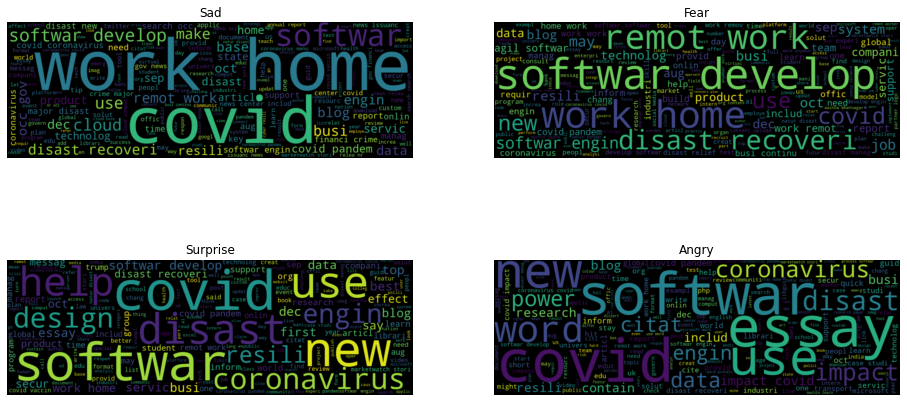

In [114]:
# Wordplot for being angry,sad,emotional
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

fig, ax = plt.subplots(2, 2, figsize=(16, 8))
k=0
j=0
for i in ['Sad','Fear','Surprise','Angry']:
  dd=df[df['dominant_emotion']==i]
  text=" ".join(dd['clean_content'])
  wordcloud = WordCloud(width=1500, height=500).generate(text)
  ax[k,j].imshow(wordcloud, interpolation='bilinear')
  ax[k,j].set_title(i)
  ax[k, j].set_axis_off()
  j+=1
  if j>1:
    k+=1
    j=0

In [ ]:
px.histogram(df,x='weekday',color='weekday',template='plotly_dark')

In [116]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import text2emotion as te
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from IPython.display import clear_output
import matplotlib.pyplot as plt
from raceplotly.plots import barplot

df1=pd.DataFrame()
df1['Emotion']=df['dominant_emotion']
df1['Day']=df['weekday']
df1['Count']=[1]*len(df)
grouped_data=df1.groupby(['Day','Emotion']).sum()
ind=np.array(list(grouped_data.index))
df2=pd.DataFrame()
df2['Day']=ind[:,0]
df2['Emotion']=ind[:,1]
df2['Count']=grouped_data.values
my_raceplot = barplot(df2,
                      item_column='Emotion',
                      value_column='Count',
                      time_column='Day')

my_raceplot.plot(title = 'Emotion in the sub reddit section',
                 item_label = 'Emotions',
                 value_label = 'Count (Total Count On That Day)',
                 frame_duration = 800)

# PNL - question-answering system

## Build an Open-Domain Question-Answering System With BERT and `ktrain`

We first install `ktrain` and load a dataset into a Python list. We use the [20 Newsgroups dataset](https://scikit-learn.org/0.19/datasets/twenty_newsgroups.html) in this example.

fonte:

- https://towardsdatascience.com/build-an-open-domain-question-answering-system-with-bert-in-3-lines-of-code-da0131bc516b

- https://nbviewer.jupyter.org/github/amaiya/ktrain/blob/master/examples/text/question_answering_with_bert.ipynb

- https://colab.research.google.com/drive/1tcsEQ7igx7lw_R0Pfpmsg9Wf3DEXyOvk

In [117]:
df.shape

(27472, 41)

In [118]:
df['clean_content'] = df['clean_content'].apply(str)

In [119]:
docs = list(df['clean_content'].values)

In [120]:
docs

['indoor illumin terpen bleach emiss lead oct  covid remot access support learn expand access ac public research return issueprevarticlenext  pub ac org doi ab ac est 9b04261',
 'cloud secur solut servic intervis extens softwar develop histori autom process era employe increas work home worri  intervi  cloud solut cloud secur',
 'ame group acquir integr ame group oct  secur servic project manag consult virtual backup cloud servic custom softwar develop solut   theamegroup  ame group acquir integr',
 'new york engin pay hit silicon valley level oct  hire softwar engin becom increas difficult year abil work home remot capac becom   ere net new york engin pay hit silicon valley level',
 'manchest data centr announc pop point offer member choic locat carrier partner also increas redund resili remain primari factor   manchesterdigit  post teledata uk ltd manchest data centr announc pop point presenc london internet exchang linx',
 'ssc gd constabl recruit ssc gd oct  ministri  director purc

In [121]:
type(docs)

list

In [122]:
import ktrain
from ktrain import text

/usr/local/lib/python3.7/dist-packages/packaging/version.py:130: DeprecationWarning:

Creating a LegacyVersion has been deprecated and will be removed in the next major release



In [ ]:
INDEXDIR = '/content/drive/My Drive/covid19impact/myindex'

### STEP 1: Create a Search Index

In [125]:
text.SimpleQA.initialize_index(INDEXDIR)
text.SimpleQA.index_from_list(docs, INDEXDIR, commit_every=len(docs))

### STEP 2: Create a QA instance
Next, we create a QA instance. This step will automatically download the BERT SQuAD model if it does not already exist on your system.

In [126]:
qa = text.SimpleQA(INDEXDIR)

### STEP 3: Ask Questions
We will invoke the ask method to issue questions to the text corpus we indexed and retrieve answers. We will also use the qa.display method to nicely display the top 5 results in this Jupyter notebook. The answers are inferred using a BERT model fine-tuned on the SQuAD dataset. The model will comb through paragraphs and sentences to find candidate answers. By default, ask currently uses a batch_size of 8, but, if necessary, you can experiment with lowering it by setting the batch_size parameter. On a CPU, for instance, you may want to try batch_size=1.


##### Space Question

In [127]:
answers = qa.ask('There are coronavirus impacts?')
qa.display_answers(answers[:20])

,Candidate Answer,Context,Confidence,Document Reference
0,virus infect peopl across itali million,coronavirus itali news nostradamus predict plagu corona virus infect peopl across itali million covid quarantin express uk news weird coronavirus itali news nostradamus predict plagu covid19 rome coronavirus latest,0.937653,6394
1,v content upload dlm upload coronavirus report,diseas brief coronavirus clariv hcov nl63 hcov hku1 sever acut respiratori syndrom coronavirus sar cov middl east respiratori virus coronavirus clari v content upload dlm upload coronavirus report,0.020837,4781
2,car coronavirus email,coronavirus newslett vox car coronavirus email vox coronavirus covid situat know reader realli want know outbreak get answer vox coronavirus latest newslett sign,0.013866,6583
3,coronavirus remot learn may imposs coronavirus remot learn imposs option mani u brace increas spread coronavirus covid weareteach,coronavirus remot learn may imposs coronavirus remot learn imposs option mani u brace increas spread coronavirus covid weareteach coronavirus remot learn imposs option mani,0.012020,6050
4,virus nescot colleg ewel epsom surrey uk,corona virus nescot colleg ewel epsom surrey uk coronavirus coronavirus inform cover colleg covid procedur dec assess open nescot ac uk coronavirus,0.005287,23470
5,respond coronavirus covid,letter custom coronavirus resourc ncr coronavirus respons resourc continu deliv softwar enhanc stori like demonstr ncr resili commit difficult challeng respond coronavirus covid coronavirus feder disast respons stimulus ncr coronavirus letter custom,0.004050,6660
6,qless coronavirus solut midst covid coronavirus crisi,qless coronavirus solut midst covid coronavirus crisi quick turn global pandem busi school govern info qless blog qless coronavirus solut,0.003769,6574
7,coronavirus covid vocabulari englishclub languag use talk new coronavirus diseas start glossari term relat,coronavirus covid vocabulari englishclub languag use talk new coronavirus diseas start glossari term relat coronavirus covid particular center system scienc engin csse john hopkin englishclub vocabulari coronavirus covid19 php,0.002517,5704


In [128]:
answers = qa.ask('There are work impacts?')
qa.display_answers(answers[:20])

,Candidate Answer,Context,Confidence,Document Reference
0,work,effect implement home work busi remot,0.842825,7027
1,climat chang impacts,climat chang impacts | hong kong observatori hko includ strong climat polici measur part post covid econom weather climat disast event us first half year hko gov hk en climat chang climat chang impact htm,0.143399,20327
2,work career work anywher work home work visa publicnewsupd,compani work around appl ban vape aggreg iq agil softwar develop agora agribusi agric investor disabl disabl disast recoveri disast relief discharg discord remot work remot worker remot work remov media work work career work anywher work home work visa publicnewsupd compani work around appl ban vape app,0.013776,5591


In [129]:
answers = qa.ask('There are software impacts?')
qa.display_answers(answers[:20])

,Candidate Answer,Context,Confidence,Document Reference
0,climat chang impacts,climat chang impacts | hong kong observatori hko includ strong climat polici measur part post covid econom weather climat disast event us first half year hko gov hk en climat chang climat chang impact htm,0.411098,20327
1,m backup,kb3215 error fail establish connect amazon s3 path hkey local machine \ software \ veeam \ veea m backup replic veea,0.187591,11009
2,mean softwar,"term servic hotjar definit includ equival definit applic law "" software "" shall mean softwar servic saa offer hotjar hotjar legal polici term servic",0.143843,23730
3,m backup replication,kb3134 hyper v backup job fail hour fail locat hkey local machine \ software \ veeam \ veea m backup replication \ dword name hvsnapshotlifetimehourhttp veeam kb3134,0.076641,7010
4,m backup replication,kb3055 vms store vvol may experi signific navig hkey local machine \ software \ veeam \ veea m backup replication \ add reg dword bit valu veeam kb3055,0.051412,1937
5,point backup,kb3073 veeam agent backup job finish collect dec locat hkey local machine \ software \ veeam \ veeam end point backup key add follow valu key name veeam kb3073,0.045608,3214
6,m backup,kb3049 publish microsoft sql databas insuffici key path hkey local machine \ software \ veeam \ veea m backup replic key writecachedirectori key reg szhttps veeam kb3049,0.043425,1548
7,agent backup job finish disk locat hkey local machine \ software \ veeam \ veeam endpoint backup,kb3123 veeam agent backup job finish disk locat hkey local machine \ software \ veeam \ veeam endpoint backup key add follow valu key name veeam kb3123,0.024863,6531
8,m endpoint backup,kb3026 veeam recoveri media creat fail oct locat hkey local machine \ software \ veeam \ veea m endpoint backup key creat follow valu key name veeam kb3026,0.015520,646


In [ ]:
%%shell
jupyter nbconvert --to html /content/03_pnl_2021all_advanced_en.ipynb